In [1]:
## d2l, matplotlib 설치

!pip install d2l==0.17.2
!pip uninstall matplotlib
!pip install matplotlib==3.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 82 kB 594 kB/s 
     |████████████████████████████████| 61 kB 8.2 MB/s 
     |████████████████████████████████| 20.1 MB 1.2 MB/s 
     |████████████████████████████████| 9.9 MB 55.1 MB/s 
     |████████████████████████████████| 11.6 MB 12.3 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.5
    Uninstalling pandas-1.3.5:
      Successfully uninstalled pandas-1.3.5
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstall

Found existing installation: matplotlib 3.3.3
Uninstalling matplotlib-3.3.3:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.3.3-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.3.3.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.3.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.8 MB 5.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are i

# 9.5 Machine Translation and the Dataset

1. 자연어 처리의 핵심인 language model을 design하기 위해 RNN 사용.
* RNN(Recurrent Neural Network): 입력과 출력을 시퀀스 단위로 처리하는 시퀀스 모델

2. **Machine translation** 이란 하나의 language 에서 다른 language의 sequence를 automatic translation 하는 것을 의미.

3. 여기서는 앞에서 배운 stastical machine translation과 구별하기 위해 Neural machine translation로 함. -> **End-to-end learning** 사용.

**1) What is End-to-end learning?**
* 입력에서 출력까지 '파이프라인 네트워크'없이 한 번에 처리하는 것
* 예를들어, 기존의 speach recognition system의 경우 음성파일 특징 추출 -> ML 알고리즘으로 음소를 알아냄 -> 음소들로 단어를 만듦 -> word 출력과 같은 복잡한 과정을 거치지만 end-to-ende learning은 음성파일에서 바로 출력을 구할 수 있음.
* **장점**

   a. 충분할 라벨링된 데이터가 있으면 신경망 모델로 해결할 수 있음.

   b. 직접 파이프라인을 설계할 필요가 줄어듦. e.g.) 사람이 feature 추출X
* **단점**

  a. 신경망에 너무 많은 계층 노드가 있거나 메모리가 부족할 경우 학습X

  b. 문제가 복잡할수록 전체를 파이프 네트워크로 나눠서 해결하는 것이 더 효율적일 수 있음.


4. Machine translation datasets -> source language를 target language로 연결하는 pairs of text sequences로 구성. 


In [1]:
import os
import torch
from d2l import torch as d2l

## **9.5.1 Downloading and Preprocessing the Dataset**


* **English (*source language*) -> French (*target language*)** 


In [3]:
# data download

d2l.DATA_HUB['fra-eng'] = (d2l.DATA_URL + 'fra-eng.zip',
                           '94646ad1522d915e7b0f9296181140edcf86a4f5')

def read_data_nmt():
    """Load the English-French dataset."""
    data_dir = d2l.download_extract('fra-eng')
    with open(os.path.join(data_dir, 'fra.txt'), 'r') as f:
        return f.read()

raw_text = read_data_nmt()
print(raw_text[:75])

Go.	Va !
Hi.	Salut !
Run!	Cours !
Run!	Courez !
Who?	Qui ?
Wow!	Ça alors !



In [4]:
# data preprocessing
# Non breaking space -> with space
# 대소문자 변환
# 단어와 구두점 사이에 space 삽입

def preprocess_nmt(text):
    """Preprocess the English-French dataset."""
    def no_space(char, prev_char):
        return char in set(',.!?') and prev_char != ' '

    # Replace non-breaking space with space, and convert uppercase letters to
    # lowercase ones
    text = text.replace('\u202f', ' ').replace('\xa0', ' ').lower()
    # Insert space between words and punctuation marks
    out = [' ' + char if i > 0 and no_space(char, text[i - 1]) else char
           for i, char in enumerate(text)]
    return ''.join(out)

text = preprocess_nmt(raw_text)
print(text[:80])

go .	va !
hi .	salut !
run !	cours !
run !	courez !
who ?	qui ?
wow !	ça alors !


In [64]:
text

'go .\tva !\nhi .\tsalut !\nrun !\tcours !\nrun !\tcourez !\nwho ?\tqui ?\nwow !\tça alors !\nfire !\tau feu !\nhelp !\tà l\'aide !\njump .\tsaute .\nstop !\tça suffit !\nstop !\tstop !\nstop !\tarrête-toi !\nwait !\tattends !\nwait !\tattendez !\ngo on .\tpoursuis .\ngo on .\tcontinuez .\ngo on .\tpoursuivez .\nhello !\tbonjour !\nhello !\tsalut !\ni see .\tje comprends .\ni try .\tj\'essaye .\ni won !\tj\'ai gagné !\ni won !\tje l\'ai emporté !\ni won .\tj’ai gagné .\noh no !\toh non !\nattack !\tattaque !\nattack !\tattaquez !\ncheers !\tsanté !\ncheers !\tà votre santé !\ncheers !\tmerci !\ncheers !\ttchin-tchin !\nget up .\tlève-toi .\ngo now .\tva , maintenant .\ngo now .\tallez-y maintenant .\ngo now .\tvas-y maintenant .\ngot it !\tj\'ai pigé !\ngot it !\tcompris !\ngot it ?\tpigé ?\ngot it ?\tcompris ?\ngot it ?\tt\'as capté ?\nhop in .\tmonte .\nhop in .\tmontez .\nhug me .\tserre-moi dans tes bras !\nhug me .\tserrez-moi dans vos bras !\ni fell .\tje suis tombée .\ni fell .\

## **9.5.2 Tokenization**

* machine translation는 **word-level tokenization** 진행. 


In [5]:
# tokenize_nmt는 text sequence pairs에 대해 tokenize하는 방식으로 진행

def tokenize_nmt(text, num_examples=None):
    """Tokenize the English-French dataset."""
    source, target = [], []
    for i, line in enumerate(text.split('\n')):
        if num_examples and i > num_examples:
            break
        parts = line.split('\t')
        if len(parts) == 2:
            source.append(parts[0].split(' '))
            target.append(parts[1].split(' '))
    return source, target

source, target = tokenize_nmt(text)
source[:6], target[:6]

([['go', '.'],
  ['hi', '.'],
  ['run', '!'],
  ['run', '!'],
  ['who', '?'],
  ['wow', '!']],
 [['va', '!'],
  ['salut', '!'],
  ['cours', '!'],
  ['courez', '!'],
  ['qui', '?'],
  ['ça', 'alors', '!']])

In [6]:
source1, target1 = tokenize_nmt(text,num_examples=30)
source1

[['go', '.'],
 ['hi', '.'],
 ['run', '!'],
 ['run', '!'],
 ['who', '?'],
 ['wow', '!'],
 ['fire', '!'],
 ['help', '!'],
 ['jump', '.'],
 ['stop', '!'],
 ['stop', '!'],
 ['stop', '!'],
 ['wait', '!'],
 ['wait', '!'],
 ['go', 'on', '.'],
 ['go', 'on', '.'],
 ['go', 'on', '.'],
 ['hello', '!'],
 ['hello', '!'],
 ['i', 'see', '.'],
 ['i', 'try', '.'],
 ['i', 'won', '!'],
 ['i', 'won', '!'],
 ['i', 'won', '.'],
 ['oh', 'no', '!'],
 ['attack', '!'],
 ['attack', '!'],
 ['cheers', '!'],
 ['cheers', '!'],
 ['cheers', '!'],
 ['cheers', '!']]

In [ ]:
source1, target1 = tokenize_nmt(text,num_examples=None)
source1

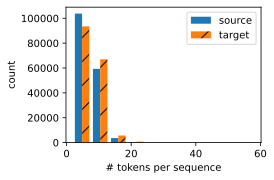

In [8]:
# Plot the histogram of the number of tokens per text sequence

def show_list_len_pair_hist(legend, xlabel, ylabel, xlist, ylist):
    """Plot the histogram for list length pairs."""
    d2l.set_figsize()
    _, _, patches = d2l.plt.hist(
        [[len(l) for l in xlist], [len(l) for l in ylist]])
    d2l.plt.xlabel(xlabel)
    d2l.plt.ylabel(ylabel)
    for patch in patches[1].patches:
        patch.set_hatch('/')
    d2l.plt.legend(legend)

show_list_len_pair_hist(['source', 'target'], '# tokens per sequence',
                        'count', source, target);

## **9.5.3 Vocabulary**

* Machine translation dataset: source language + target language -> Two vocabularies 구축 가능
* Word-level tokenization vocabulary size 큼 -> 2회 이하 토큰: <"unk">  
* 그 외에 for padding <"pad">, for marking the beginning <"bos"> or end <"eos">

In [9]:
src_vocab1 = d2l.Vocab(source,
                      reserved_tokens=['<pad>', '<bos>', '<eos>'])
len(src_vocab1)

14884

In [10]:
src_vocab = d2l.Vocab(source, min_freq=2,
                      reserved_tokens=['<pad>', '<bos>', '<eos>'])
len(src_vocab)

10012

## **9.5.4 Reading the Dataset**

# Truncate and Padding
* Source and target text sequences는 different lengths를 가지고 있음
* we can still process a minibatch of text sequences at one time by *truncation* and *padding*.
* Same minibatch의 모든 sequence가 동일한 num_steps를 가졍한다고 하면 text sequence에 num_steps tocken보다 많은 수의 token이 있을 경우 첫번째 num_steps token만 취하고 나머지는 버리는 방식으로 text sequence를 자르게 됨 (truncate). 만약 적은 수의 token이 있는 경우 길이가 num_steps에 도달할 때까지 "&lt;pad&gt;" token을 끝에 계속 추가하는 방식.
* 모든 text sequence는 동일한 minibatch안에서 **동일한 length**를 가지게 됨. 



In [11]:
# Truncation and Padding (text sequence의 동일한 minibatch안에서 동일한 length를 가지게 하기 위함)

def truncate_pad(line, num_steps, padding_token):
    """Truncate or pad sequences."""
    if len(line) > num_steps:
        return line[:num_steps]  # Truncate
    return line + [padding_token] * (num_steps - len(line))  # Pad

truncate_pad(src_vocab[source[0]], 10, src_vocab['<pad>'])

[47, 4, 1, 1, 1, 1, 1, 1, 1, 1]

* Now we define a function to **transform
text sequences into minibatches for training.**
We append the special “&lt;eos&gt;” token
to the end of every sequence to indicate the
end of the sequence.
When a model is predicting
by
generating a sequence token after token,
the generation
of the “&lt;eos&gt;” token
can suggest that
the output sequence is complete.
* text sequence를 minibatch로 변환하여 training 을 정의하고,모든 시퀀스 끝에  “&lt;eos&gt;" 토큰을 추가해줌.
* 모델이 token 뒤에 있는 sequence token을 생성하는 것을 예측할때,  “&lt;eos&gt;” token이 output sequence가 끝났다는 것을 암시하게 할 수 있음. 

In [12]:
def build_array_nmt(lines, vocab, num_steps):
    """Transform text sequences of machine translation into minibatches."""
    lines = [vocab[l] for l in lines]
    lines = [l + [vocab['<eos>']] for l in lines]
    array = torch.tensor([truncate_pad(
        l, num_steps, vocab['<pad>']) for l in lines])
    valid_len = (array != vocab['<pad>']).type(torch.int32).sum(1)
    return array, valid_len

In [13]:
build_array_nmt(source, src_vocab,10)

(tensor([[  47,    4,    3,  ...,    1,    1,    1],
         [2944,    4,    3,  ...,    1,    1,    1],
         [ 435,  126,    3,  ...,    1,    1,    1],
         ...,
         [ 381,   60,   26,  ...,  117,  885, 2801],
         [  66,  295,   90,  ...,  461,   13,    6],
         [  17,  176,   32,  ...,  759,    0, 7938]]),
 tensor([ 3,  3,  3,  ..., 10, 10, 10]))

## **9.5.5 Putting All Things Together**

* 앞서 언급한 요소들을 `load_data_nmt` function에 할당하고, source/target language 모두의 voca에 적용되도록 합치는 과정.

In [14]:
def load_data_nmt(batch_size, num_steps, num_examples=600):
    """Return the iterator and the vocabularies of the translation dataset."""
    text = preprocess_nmt(read_data_nmt())
    source, target = tokenize_nmt(text, num_examples)
    src_vocab = d2l.Vocab(source, min_freq=2,
                          reserved_tokens=['<pad>', '<bos>', '<eos>'])
    tgt_vocab = d2l.Vocab(target, min_freq=2,
                          reserved_tokens=['<pad>', '<bos>', '<eos>'])
    src_array, src_valid_len = build_array_nmt(source, src_vocab, num_steps)
    tgt_array, tgt_valid_len = build_array_nmt(target, tgt_vocab, num_steps)
    data_arrays = (src_array, src_valid_len, tgt_array, tgt_valid_len)
    data_iter = d2l.load_array(data_arrays, batch_size)
    return data_iter, src_vocab, tgt_vocab

In [15]:
train_iter, src_vocab, tgt_vocab = load_data_nmt(batch_size=2, num_steps=8)
for X, X_valid_len, Y, Y_valid_len in train_iter:
    print('X:', X.type(torch.int32))
    print('valid lengths for X:', X_valid_len)
    print('Y:', Y.type(torch.int32))
    print('valid lengths for Y:', Y_valid_len)
    break

X: tensor([[17, 20,  4,  3,  1,  1,  1,  1],
        [77, 21,  4,  3,  1,  1,  1,  1]], dtype=torch.int32)
valid lengths for X: tensor([4, 4])
Y: tensor([[ 11,  61, 146,   4,   3,   1,   1,   1],
        [ 75,  34,   5,   3,   1,   1,   1,   1]], dtype=torch.int32)
valid lengths for Y: tensor([5, 4])


## Summary

* Machine translation은 하나의 언어에서 또 다른 언어로 sequence를 자동으로 번역하는 것을 의미함
* Word-level tokenization를 사용하면 voca size가 character-level tokenization를 사용하는 것보다 더 커짐. 이를 위해 빈도가 낮은 token은 알수 없는 token으로 취급 가능함 **("&lt;unk&gt;") token**.
*  Text sequences를 자르고 채울 수 있으므로 모든 text sequences가 minibatch에서의 동일한 길이를 갖게 됨.

## Exercises

* 1. Try different values of the `num_examples` argument in the `load_data_nmt` function. How does this affect the vocabulary sizes of the source language and the target language?

* 2. Text in some languages such as Chinese and Japanese does not have word boundary indicators (e.g., space). Is word-level tokenization still a good idea for such cases? Why or why not?


# **9.6 Encoder-Decoder Architecture**

* 입력 문장과 출력 문장의 길이가 다를 경우 사용
* 예를들어, 영어를 프랑스어로 번역을 한다고 할 때 :영어 입력 "They","are","watching","." -> 프랑스어 출력 "lls","regardent","."
* To handle this type of inputs and outputs,
we can design an architecture with two major components, **encoder** and **decoder**. 
* **Encoder**: variable-length sequence를 input으로 받고, fixed shape state 변환
* **Decoder**: fixed shape state를 받아서, variable-length sequence로 매핑함.


![The encoder-decoder architecture.](https://github.com/d2l-ai/d2l-pytorch-colab/blob/master/img/encoder-decoder.svg?raw=1)


## **9.6.1 Encoder**

* In the encoder interface,
we just specify that
the encoder takes variable-length sequences as the input `X`.
The implementation will be provided 
by any model that inherits this base `Encoder` class.


In [67]:
# input X <- variable length sequence 를 받는 Encoder class

from torch import nn

class Encoder(nn.Module):
    """The base encoder interface for the encoder-decoder architecture."""
    def __init__(self, **kwargs):
        super(Encoder, self).__init__(**kwargs)
    
    # Later there can be additional arguments (e.g., length excluding padding)
    def forward(self, X, *args):
        raise NotImplementedError

## **9.6.2 Decoder**

* In the following decoder interface,
we add an additional `init_state` function
to convert the encoder output (`enc_outputs`) into the encoded state.

* Token별로 variable-length sequence token을 생성하기 위해서 이 단계에서 decoder가 input과 encoded state를 output token으로 맵핑할 수 있음 


In [19]:
class Decoder(nn.Module):
    """The base decoder interface for the encoder-decoder architecture."""
    def __init__(self, **kwargs):
        super(Decoder, self).__init__(**kwargs)

    def init_state(self, enc_outputs, *args):    # Encoder output -> encoded state
        raise NotImplementedError

    def forward(self, X, state):
        raise NotImplementedError

## **9.6.3 Putting the Encoder and Decoder Together**



In [20]:
class EncoderDecoder(nn.Module):
    """The base class for the encoder-decoder architecture."""
    def __init__(self, encoder, decoder, **kwargs):
        super(EncoderDecoder, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, enc_X, dec_X, *args):
        enc_outputs = self.encoder(enc_X, *args)
        dec_state = self.decoder.init_state(enc_outputs, *args)
        # Return decoder output only
        return self.decoder(dec_X, dec_state)

## Summary

* Encoder-decoder architecture는 variable-length sequence인 input과 output을 모두 처리할 수 있으므로 machine translation과 같은 sequence transformation 문제에 적합함.
* Encoder는 variable-length sequence를 입력으로 받아 fixed-length sequence로 변환. 
* decoder는 fixed shape를 variable-length sequence로 맵핑.


## Exercises

* Q1. Suppose that we use neural networks to implement the encoder-decoder architecture. Do the encoder and the decoder have to be the same type of neural network?  
* A1. 어떤 network 이든 간에 동일한 sequence나 outcome의 값을 꺼내어 올 수 있다면, 바로 input으로 넣을 수 있기 때문에, 굳이 같은 type의 neural network일 필요는 없음.

* Q2. Besides machine translation, can you think of another application where the encoder-decoder architecture can be applied?
* A2. Computer vision 에서 autoencoder구조에도 해당 encoder-decoder를 사용가능


#  **9.7 Sequence to Sequence Learning**

* Machine translation -> input and output 모두 variable length sequence.
* 위의 문제를 해결하기 위해 encoder-decoder architecture designed.
* 이번 장에서 Two RNN을 사용하여 encoder-decoder architecture 설계 -> 기계번역을 위한 **sequence to sequence** learning에 사용

* The RNN encoder (variable-length sequence as input-> fixed-shape hidden state 변환) => input sequence의 정보는 RNN encoder의 hidden state에 encoding됨.

* 토큰별로 output sequence의 토큰을 생성하기 위해 RNN decoder는 기존의 생성된 토큰 + input sequence의 encoded information 기반으로 다음 토큰 예측.


![Sequence to sequence learning with an RNN encoder and an RNN decoder.](http://d2l.ai/_images/seq2seq.svg)


* <"eos">-> end of the sequence => 이 토큰이 생성되면 모델이 prediction을 중지
* RNN decoder의 초기 단계에서 보이는 2가지 특징
* 1) 초기 입력으로 문장의 시작을 의미하는 <"bos"> 토큰이 들어감
* 2) RNN encoder의 마지막 은닉 상태가 RNN decoder의 첫번째 은닉 상태에 사용됨. 일부 모델 디자인에서는 encoder의 final hidden state를 decoder의 time step에서 input으로 들어갈 수 도 있음.


In [32]:
import collections
import math
import torch
from torch import nn
from torch.nn import functional as F
from d2l import torch as d2l

## **9.7.1 Encoder**

* Encoder는 variable length인 input sequence를 fixed-shape context variable $\mathbf{c}$로 변환함, 그리고 input sequence information을 encode함. 

* Input sequence가 $x_1, \ldots, x_T$ 있다고 할 때, $x_t$는 input sequence text의 $t^{\mathrm{th}}$ token 임. Time step $t$에서 RNN은 input feature vector인 $\mathbf{x}_t$와 이전 시점의 hidden state인 $\mathbf{h} _{t-1}$를 통해 $\mathbf{h} _{t}$로 변환함. 이를 수식으로 표현하면 다음과 같음. 

$$\mathbf{h}_t = f(\mathbf{x}_t, \mathbf{h}_{t-1}). $$

* The encoder transforms the hidden states at
all the time steps
into the context variable through a customized function $q$:

$$\mathbf{c} =  q(\mathbf{h}_1, \ldots, \mathbf{h}_T).$$


* embedding layer를 사용하여 Input sequence의 각token에 대한 feature vector를 얻음.
 
* Embedding layer의 weight는 row의 갯수가 size of input vocabulary(`vocab_size`)와 같고, column의 갯수가 feature vector's dimension(`embed_size`)과 같은 matrix.

* Encoder를 위한 형태로 multilayer GRU를 사용함. 


In [33]:
class Seq2SeqEncoder(d2l.Encoder):
    """The RNN encoder for sequence to sequence learning."""
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers,
                 dropout=0, **kwargs):
        super(Seq2SeqEncoder, self).__init__(**kwargs)
        # Embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.rnn = nn.GRU(embed_size, num_hiddens, num_layers,
                          dropout=dropout)

    def forward(self, X, *args):
        # The output `X` shape: (`batch_size`, `num_steps`, `embed_size`)
        X = self.embedding(X)
        # In RNN models, the first axis corresponds to time steps
        # RNN 구조에 input을 넣어주기 위해 permute 실행 (`batch_size`,`embed_size`,`num_steps`)
        X = X.permute(1, 0, 2)
        # When state is not mentioned, it defaults to zeros
        output, state = self.rnn(X)
        # `output` shape: (`num_steps`, `batch_size`, `num_hiddens`)
        # `state` shape: (`num_layers`, `batch_size`, `num_hiddens`)
        return output, state

In [34]:
# 2 layer GRU, hidden units=16, size of input vocabulary =10, feature vector's dimension=8
# Sequence input X의 mini batch (batch size:4, N of time steps:7)

vocab_size, embed_size, num_hiddens, num_layers = 10, 8, 16, 2
batch_size, num_steps = 4, 7

encoder = Seq2SeqEncoder(vocab_size, embed_size, num_hiddens, num_layers)

X = torch.zeros((batch_size, num_steps), dtype=torch.long)
output, state = encoder(X)

In [35]:
# all time steps에서 last layer의 hidden state는 [number of time steps, batch size, number of hidden units] 모양의 텐서 

output.shape

torch.Size([7, 4, 16])

In [36]:
# GRU (hidden state를 계속 update)를 적용하였기 때문에 final time step에서 multilayer hidden state의 shape은 [number of hidden layers, batch size, number of hidden units] 형태

state.shape

torch.Size([2, 4, 16])

## **9.7.2 Decoder**

* context variable $\mathbf{c}$:전체 input sequence $x_1, \ldots, x_T$ 의 정보를 담은 variable
* training dataset으로부터 각 time step $t^\prime$에 대해output sequence $y_1, \ldots, y_T$가 주어지면, decoder output의 확률 $y_{t^\prime}$은 previous output subsequence $y_1, \ldots, y_{t^\prime-1}$와 context variable $\mathbf{c}$를 조건으로 함

$$\mathbf{𝑃}(y_{t^\prime}| \mathbf{y_1, \ldots, y_{t^\prime-1}},\mathbf{c})$$

* Sequence의 conditional probability를 modeling하기 위해 또 다른 RNN을 decoder로 사용할 수 있음. Output sequence의 time step $t^\prime$에서, RNN은 이전 time step의 output값 $y_{t^\prime-1}$과 context variable $\mathbf{c}$, 이전의 hidden state $\mathbf{s}_{t^\prime-1}$ 를 통해 현재의 hidden state를 구하게 됨. 그 결과 함수 $g$를 사용하여 decoder의 hidden layer의 변환을 표현할 수 있음.

$$\mathbf{s}_{t^\prime} = g(y_{t^\prime-1}, \mathbf{c}, \mathbf{s}_{t^\prime-1})$$ 





* Decoder의 hidden state를 얻고 난 뒤, output layer와 softmax 연산을 사용하여 time step $t^\prime$에서 output에 대한 conditional probablility distribution $\mathbf{𝑃}(y_{t^\prime}| \mathbf{y_1, \ldots, y_{t^\prime-1}},\mathbf{c})$ 를 계산할 수 있음. 

* RNN encoder와 decoder에서 동일한 layer와 hidden unit 요구. Input sequence information을 합하기 위해서 context variable는 모든 time step에서의 decoder input들과 concat됨.
* output token의 분포 확률을 예측 -> fully-connected layer를 사용하여 RNN decoder의 final layer에서 hidden state를 변환함.


In [37]:
class Seq2SeqDecoder(d2l.Decoder):
    """The RNN decoder for sequence to sequence learning."""
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers,
                 dropout=0, **kwargs):
        super(Seq2SeqDecoder, self).__init__(**kwargs)
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.rnn = nn.GRU(embed_size + num_hiddens, num_hiddens, num_layers,
                          dropout=dropout)
        self.dense = nn.Linear(num_hiddens, vocab_size)

    def init_state(self, enc_outputs, *args):           # Encoder output -> encoded state
        return enc_outputs[1]

    def forward(self, X, state):
        # The output `X` shape: (`num_steps`, `batch_size`, `embed_size`)
        X = self.embedding(X).permute(1, 0, 2)
        # Broadcast `context` so it has the same `num_steps` as `X`
        context = state[-1].repeat(X.shape[0], 1, 1)
        X_and_context = torch.cat((X, context), 2)
        output, state = self.rnn(X_and_context, state)
        output = self.dense(output).permute(1, 0, 2)
        # `output` shape: (`batch_size`, `num_steps`, `vocab_size`)
        # `state` shape: (`num_layers`, `batch_size`, `num_hiddens`)
        return output, state

In [38]:
# 2 layer GRU, hidden units=16, size of input vocabulary =10, feature vector's dimension=8
## output shape (`batch_size`, `num_steps`, `vocab_size`), Tensor의 last dimension에 predicted token distribution이 저장됨. 
decoder = Seq2SeqDecoder(vocab_size=10, embed_size=8, num_hiddens=16,
                         num_layers=2)
decoder.eval()
state = decoder.init_state(encoder(X))
output, state = decoder(X, state)
output.shape, state.shape

(torch.Size([4, 7, 10]), torch.Size([2, 4, 16]))

![Layers in an RNN encoder-decoder model.](https://github.com/d2l-ai/d2l-pytorch-colab/blob/master/img/seq2seq-details.svg?raw=1)

* Layers in an RNN encoder-decoder model

## **9.7.3 Encoder-Decoder for Sequence to Sequence Learning**

* Sequence to Sequence 학습을 위해 RNN encoder-decoder model은 RNN encoder와 RNN decoder를 함께 배치

In [39]:
class Seq2Seq(d2l.EncoderDecoder):
    def __init__(self, encoder, decoder, tgt_pad, lr):
        super().__init__(encoder, decoder)
        self.save_hyperparameters()

    def validation_step(self, batch):
        Y_hat = self(*batch[:-1])
        self.plot('loss', self.loss(Y_hat, batch[-1]), train=False)

    def configure_optimizers(self):
        # Adam optimizer is used here
        return torch.optim.Adam(self.parameters(), lr=self.lr)

## **9.7.4 Loss Function with Masking**

* 각 time step에서 decoder는 output tokens에 대한 probability distribution를 예측함
* Softmax를 적용하여 distribution을 얻고, optimization을 위한 cross-entropy loss를 계산할 수 있음
* 앞에서 배운 special padding token이 시퀀스 끝에 추가하여 다양한 길이의 시퀀스가 같은 모양의 minibatche에 효율적으로 load되도록 함
* **However**, padding token의 prediction은 loss calculation에서 제외되어야 함. -> 관련없는 항목들을 zero value로 마스킹 하여 관련 없는 예측 값을 곱해도 zero가 되게함. 

In [40]:
def sequence_mask(X, valid_len, value=0):
    """Mask irrelevant entries in sequences."""
    maxlen = X.size(1)
    mask = torch.arange((maxlen), dtype=torch.float32,
                        device=X.device)[None, :] < valid_len[:, None]
    X[~mask] = value
    return X

X = torch.tensor([[1, 2, 3], [4, 5, 6]])
sequence_mask(X, torch.tensor([1, 2]))

tensor([[1, 0, 0],
        [4, 5, 0]])

In [41]:
# zero가 아닌 다른 value로도 masking가능 (여기에서는 -1로 masking 처리)

X = torch.ones(2, 3, 4)
sequence_mask(X, torch.tensor([1, 2]), value=-1)

tensor([[[ 1.,  1.,  1.,  1.],
         [-1., -1., -1., -1.],
         [-1., -1., -1., -1.]],

        [[ 1.,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  1.],
         [-1., -1., -1., -1.]]])

In [50]:
class MaskedSoftmaxCELoss(nn.CrossEntropyLoss):
    """The softmax cross-entropy loss with masks."""
    # `pred` shape: (`batch_size`, `num_steps`, `vocab_size`)
    # `label` shape: (`batch_size`, `num_steps`)
    # `valid_len` shape: (`batch_size`,)
    def forward(self, pred, label, valid_len):
        weights = torch.ones_like(label)
        weights = sequence_mask(weights, valid_len)
        self.reduction='none'
        unweighted_loss = super(MaskedSoftmaxCELoss, self).forward(
            pred.permute(0, 2, 1), label)
        weighted_loss = (unweighted_loss * weights).mean(dim=1)
        return weighted_loss

## **9.7.5 Training**
* we can create and train an RNN encoder-decoder model for sequence to sequence learning on the machine translation dataset.

In [2]:
import d2l

In [51]:


def train_seq2seq(net, data_iter, lr, num_epochs, tgt_vocab, device):
    """Train a model for sequence to sequence."""
    def xavier_init_weights(m):
        if type(m) == nn.Linear:
            nn.init.xavier_uniform_(m.weight)
        if type(m) == nn.GRU:
            for param in m._flat_weights_names:
                if "weight" in param:
                    nn.init.xavier_uniform_(m._parameters[param])
    net.apply(xavier_init_weights)
    net.to(device)
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    loss = MaskedSoftmaxCELoss()
    net.train()
    animator = d2l.Animator(xlabel='epoch', ylabel='loss',
                            xlim=[10, num_epochs])
    for epoch in range(num_epochs):
        timer = d2l.Timer()
        metric = d2l.Accumulator(2)  # Sum of training loss, no. of tokens
        for batch in data_iter:
            optimizer.zero_grad()
            X, X_valid_len, Y, Y_valid_len = [x.to(device) for x in batch]
            bos = torch.tensor([tgt_vocab['<bos>']] * Y.shape[0],
                               device=device).reshape(-1, 1)
            dec_input = torch.cat([bos, Y[:, :-1]], 1)  # Teacher forcing
            Y_hat, _ = net(X, dec_input, X_valid_len)
            l = loss(Y_hat, Y, Y_valid_len)
            l.sum().backward()  # Make the loss scalar for `backward`
            d2l.grad_clipping(net, 1)
            num_tokens = Y_valid_len.sum()
            optimizer.step()
            with torch.no_grad():
                metric.add(l.sum(), num_tokens)
        if (epoch + 1) % 10 == 0:
            animator.add(epoch + 1, (metric[0] / metric[1],))
    print(f'loss {metric[0] / metric[1]:.3f}, {metric[1] / timer.stop():.1f} '
          f'tokens/sec on {str(device)}')

loss 0.020, 13041.0 tokens/sec on cuda:0


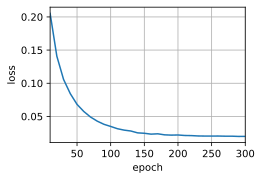

In [52]:
embed_size, num_hiddens, num_layers, dropout = 32, 32, 2, 0.1
batch_size, num_steps = 64, 10
lr, num_epochs, device = 0.005, 300, d2l.try_gpu()

train_iter, src_vocab, tgt_vocab = d2l.load_data_nmt(batch_size, num_steps)
encoder = Seq2SeqEncoder(
    len(src_vocab), embed_size, num_hiddens, num_layers, dropout)
decoder = Seq2SeqDecoder(
    len(tgt_vocab), embed_size, num_hiddens, num_layers, dropout)
net = d2l.EncoderDecoder(encoder, decoder)
train_seq2seq(net, train_iter, lr, num_epochs, tgt_vocab, device)

## **9.7.5 Prediction**

* Token별로 output sequence token을 prediction을 하기 위해서 각 decoder time step에서 이전 time step에서 예측된 token이 decoder의 input으로 들어감. Training과 유사하게 initial time step의 beginning of sequence ("&lt;bos&gt;") token이 decoder에 들어감. end of sequence ("&lt;eos&gt;") token이 예측되면 output sequence의 예측이 완료됨.                                                                                                                                                       


![Predicting the output sequence token by token using an RNN encoder-decoder.](https://github.com/d2l-ai/d2l-pytorch-colab/blob/master/img/seq2seq-predict.svg?raw=1)

Predicting the output sequence token by token using an RNN encoder-decoder

In [59]:
def predict_seq2seq(net, src_sentence, src_vocab, tgt_vocab, num_steps,
                    device, save_attention_weights=False):
    """Predict for sequence to sequence."""
    # Set `net` to eval mode for inference
    net.eval()
    src_tokens = src_vocab[src_sentence.lower().split(' ')] + [
        src_vocab['<eos>']]
    enc_valid_len = torch.tensor([len(src_tokens)], device=device)
    # Token에 대한 전처리 부분 (truncate / padding)
    src_tokens = d2l.truncate_pad(src_tokens, num_steps, src_vocab['<pad>'])
    # Add the batch axis
    enc_X = torch.unsqueeze(
        torch.tensor(src_tokens, dtype=torch.long, device=device), dim=0)
    # Encoder, decoder에 대한 setting 부분
    enc_outputs = net.encoder(enc_X, enc_valid_len)
    dec_state = net.decoder.init_state(enc_outputs, enc_valid_len)
    # Add the batch axis
    # Decoder 부분에 대한 starting point 정의 ('<bos>')
    dec_X = torch.unsqueeze(torch.tensor(
        [tgt_vocab['<bos>']], dtype=torch.long, device=device), dim=0)
    output_seq, attention_weight_seq = [], []
    for _ in range(num_steps):
        Y, dec_state = net.decoder(dec_X, dec_state)
        # The highest prediction likelihood 인 token을 다음 step에 
        # 연결할 decoder의 input으로 간주함
        dec_X = Y.argmax(dim=2)
        pred = dec_X.squeeze(dim=0).type(torch.int32).item()
        # Save attention weights (to be covered later)
        if save_attention_weights:
            attention_weight_seq.append(net.decoder.attention_weights)
        # Once the end-of-sequence token is predicted, the generation of the
        # output sequence is complete ('<eos>' 지점에 도달하면)
        if pred == tgt_vocab['<eos>']:
            break
        output_seq.append(pred)
    return ' '.join(tgt_vocab.to_tokens(output_seq)), attention_weight_seq

## **9.7.7 Evaluation of Predicted Sequences**

* BLEU (Bilingual Evaluation Understudy): output sequences의 출력 품질에 사용 
* Predicted sequence에서의 $n$-grams에 대해 BLEU는 label sequence에서  $n$-grams이 나타나는지에 대해 평가함.

* Given a label sequence $A$, $B$, $C$, $D$, $E$, $F$,
and a predicted sequence $A$, $B$, $B$, $C$, $D$,
we have $p_1 = 4/5$,  $p_2 = 3/4$, $p_3 = 1/3$, and $p_4 = 0$. Let $\mathrm{len}_{\text{label}}$ and $\mathrm{len}_{\text{pred}}$
be
the numbers of tokens in the label sequence and the predicted sequence.
* BLEU is defined (where $k$ is the longest $n$-grams for matching) as

$$ \exp\left(\min\left(0, 1 - \frac{\mathrm{len}_{\text{label}}}{\mathrm{len}_{\text{pred}}}\right)\right) \prod_{n=1}^k p_n^{1/2^n},$$


* Predicted sequence와 label sequence가 같을때, BLEU는 1이 됨. $n$-gram이 길어질수록 더 어려워지기 때문에, BLEU는 $n$-gram이 더 길어질때 더 높은 weight를 할당함. 짧은 시퀀스를 예측하면 더 높은 값을 얻는 경향이 있기 때문에 더 짧ㅇ은 예측 시퀀스에는 페널티를 줌.



In [60]:
def bleu(pred_seq, label_seq, k):
    """Compute the BLEU."""
    pred_tokens, label_tokens = pred_seq.split(' '), label_seq.split(' ')
    len_pred, len_label = len(pred_tokens), len(label_tokens)
    score = math.exp(min(0, 1 - len_label / len_pred))
    for n in range(1, min(k, len_pred) + 1):
        num_matches, label_subs = 0, collections.defaultdict(int)
        for i in range(len_label - n + 1):
            label_subs[' '.join(label_tokens[i: i + n])] += 1
        for i in range(len_pred - n + 1):
            if label_subs[' '.join(pred_tokens[i: i + n])] > 0:
                num_matches += 1
                label_subs[' '.join(pred_tokens[i: i + n])] -= 1
        score *= math.pow(num_matches / (len_pred - n + 1), math.pow(0.5, n))
    return score

In [63]:
## we use the trained RNN encoder-decoder to translate a few English sentences into French and compute the BLEU of the results.

engs = ['go .', "i lost .", 'he\'s calm .', 'i\'m home .']
fras = ['va !', 'j\'ai perdu .', 'il est calme .', 'je suis chez moi .']
for eng, fra in zip(engs, fras):
    translation, attention_weight_seq = predict_seq2seq(
        net, eng, src_vocab, tgt_vocab, num_steps, device)
    print(f'{eng} => {translation}, bleu {bleu(translation, fra, k=2):.3f}')

go . => va !, bleu 1.000
i lost . => j'ai perdu ., bleu 1.000
he's calm . => il est <unk> est tombé ?, bleu 0.386
i'm home . => je suis calme chez aller court venu ?, bleu 0.376


## Summary

* 인코더-디코더 아키텍처의 설계에 따라 두 개의 RNN을 사용하여 시퀀스 대 시퀀스 학습을 위한 모델을 설계할 수 있음.

* Teacher forcing을 사용하여 training함

* 인코더와 디코더를 구현할 때 multilayer RNN을 사용할 수 있음.

* mask를 사용하여 손실을 계산할 때와 같이 관련 없는 계산을 filter out.

* BLEU는 예측된 시퀀스와 레이블 시퀀스 사이의 matching n-grams을 계산하여 출력 시퀀스를 평가하는 데 널리 사용되는 측정값






## Teacher forcing

* RNN의 모든 시점에 대해서 이전 시점의 예측값 대신 실제값을 입력으로 주는 방법
* 훈련 과정에서 이전 시점의 디코더 셀의 출력을 현재 시점의 디코더 셀의 입력으로 넣어주지 않고, 이전 시점의 실제값을 현재 시점의 디코더 셀의 입력값으로 하는 방법. 
* d/t 이전 시점의 디코더 셀의 예측이 틀렸는데 이를 현재 시점의 디코더 셀의 입력으로 사용하면 현재 시점의 디코더 셀의 예측도 잘못될 가능성이 높고 이는 연쇄 작용으로 디코더 전체의 예측을 어렵게 함. 
* 이런 상황이 반복되면 훈련 시간이 느려짐.

## Exercises

1. **Translation result를 improve하기 위해 hyperparameter를 수정할 수 있을지?**(Can you adjust the hyperparameters to improve the translation results?) 
1. **Loss calculation에서 masking 작업 없이 rerun하게 되면 어떤 결과를 볼 수 있는지? 그 이유는?** (Rerun the experiment without using masks in the loss calculation. What results do you observe? Why?)
1. **Encoder와 decoder가 layer의 수나 hidden units수가 다르다면 decoder의 hidden layer를 어떻게 초기화할 수 있을까?** (If the encoder and the decoder differ in the number of layers or the number of hidden units, how can we initialize the hidden state of the decoder?)
1. **Training step에서 decoder에 previous time step의 prediction을 제공하는 것으로 대체함. 이것이 성능에 어떤 영향 주는지?**(In training, replace teacher forcing with feeding the prediction at the previous time step into the decoder. How does this influence the performance?)

# **9.8 Beam Search**
* End-of-sequence "&lt;eos&gt;" token이 prediction될 때까지 토큰별로 output sequence token을 예측함. 
* greedy search, exhaustive search, beam search에 대한 내용 소개

## **9.8.1 Greedy Search**

* 기본적인 Sequence to sequence (이하 Seq2seq) 모델에서의 디코딩 과정은 보통 Greedy Decoding 방식을 따름

* 단순하게 해당 시점에서 가장 확률이 높은 후보를 선택 -> 시간복잡도면에서는 훌륭! but, 최종 정확도 관점에서는 좋지 못함.

* 이러한 예측에서 한 번이라도 틀린 예측이 나오게 된다면, 이전 예측이 중요한 디코딩 방식에서는 치명적인 문제가 됨.

* In greedy search,
at any time step $t'$ of the output sequence, 
we search for the token 
with the highest conditional probability (as the output) from $\mathcal{Y}$, i.e., 

$$y_{t'} = \operatorname*{argmax}_{y \in \mathcal{Y}} P(y \mid y_1, \ldots, y_{t'-1}, \mathbf{c}),$$


* The *optimal sequence*
should be the output sequence
with the maximum 
$\prod_{t'=1}^{T'} P(y_{t'} \mid y_1, \ldots, y_{t'-1}, \mathbf{c})$,
which is
the conditional probability of generating an output sequence based on the input sequence.


![At each time step, greedy search selects the token with the highest conditional probability.](https://github.com/d2l-ai/d2l-en-colab/blob/master/img/s2s-prob1.svg?raw=1)

* At each time step, **greedy search selects the token with the highest conditional probability**. 
Therefore, the output sequence "A", "B", "C", and "&lt;eos&gt;" will be predicted as $0.5\times0.4\times0.4\times0.6 = 0.048$.


reference: https://sooftware.io/beamsearch/

## **9.8.2 Exhaustive Search**

* If the goal is to obtain the optimal sequence, we may consider using *exhaustive search*: 
exhaustively enumerate all the possible output sequences with their conditional probabilities,
then output the one 
with the highest conditional probability.
-> Conditional probability를 가지고 모든 가능한 output sequences에 대한 반복을 진행해서 highest condition probability를 output으로 도출함. 
* Although we can use exhaustive search to obtain the optimal sequence, 
its computational cost $\mathcal{O}(\left|\mathcal{Y}\right|^{T'})$ is likely to be excessively high. 
For example, when $|\mathcal{Y}|=10000$ and $T'=10$, we will need to evaluate $10000^{10} = 10^{40}$ sequences. 
-> $|\mathcal{Y}|$가 10000이고, time step이 10개가 있다고 하면 $10^{40}$ sequences 만큼 실행..



## **9.8.3 Beam Search**

* 가장 좋은 방법은 Exhaustive Search를 사용하는 것이겠지만, 시간 복잡도면에서 사실상 불가능 

* What if only accuracy matters?
Obviously, exhaustive search.
What if only computational cost matters?
Clearly, greedy search.
A real-world application usually asks
a complicated question,
somewhere in between those two extremes.

![The process of beam search (beam size: 2, maximum length of an output sequence: 3). The candidate output sequences are $A$, $C$, $AB$, $CE$, $ABD$, and $CED$.](https://github.com/d2l-ai/d2l-en-colab/blob/master/img/beam-search.svg?raw=1)


* Suppose that the output vocabulary
contains only five elements: 
$\mathcal{Y} = \{A, B, C, D, E\}$, 
where one of them is “&lt;eos&gt;”. 
Let the beam size be 2 and 
the maximum length of an output sequence be 3. 
-> Output vocabulary가 $\mathcal{Y} = \{A, B, C, D, E\}$ 를 구성하고 있다고 할 때, 그 중에 하나는 “&lt;eos&gt;”를 포함하고 있고, 이 때 beam size를 2로 하고 output sequence의 maximum length는 3으로 함. 
* input 값을 바탕으로 나온 예측 값의 확률 분포 중 가장 높은 확률 2개를 고름
* step1: $P(y_1|\mathbf{c})\$는 A와 C

* step2: $P(A, y_2|\mathbf{c})\= $$P(A, B|\mathbf{c}), P(C, y_2|\mathbf{c})= P(C, E|\mathbf{c})\$

* step3: $P(A,B,y_3|\mathbf{c})\= $$P(A, B,D|\mathbf{c}), P(C, E, y_3|\mathbf{c})= P(C,E,D|\mathbf{c})\$

* six candidate output sequence를 얻음 -> **A, C, AB, CE, ABD, CED** -> 가장 높은 점수를 가진 시퀀스를 출력 시퀀스로 선택

 $$ \frac{1}{L^\alpha} \log P(y_1, \ldots, y_{L}\mid \mathbf{c}) = \frac{1}{L^\alpha} \sum_{t'=1}^L \log P(y_{t'} \mid y_1, \ldots, y_{t'-1}, \mathbf{c})$$

* L은 length of the final candidate sequence를 의미, 일반적으로 $\alpha$는 0.75로 setting.
* 누적 확률 계산시에 필요한 length penalty를 보면, 확률의 범위는 0.0~1.0 이다. 이는 누적하여 곱할수록 크기가 점점 작아진다는 것을 의미 -> 길이에 따른 불공평을 해소하기 위해 $L{^⍺}$에서 긴 시퀀스에 페널티를 줌.


##Summary

* Sequence searching 전략에는 greedy search, exhaustive search, and beam search가 있다.
* Beam search는 beam size의 flexible한 선택을 통해 accuracy와 computational cost간의 균형을 제공함.